# Assignment 3: Stereo Vision - Part 1.1 Block Matching
In this section, we compute the horizontal disparity (shift) between a left and right stereo image pair. Because the images are taken with a forward-facing camera and translated horizontally, we can search for pixel matches along the same row (scanline). 

We will compute the disparity using two cost metrics: **Sum of Absolute Differences (SAD)** and **Sum of Squared Differences (SSD)** across varying window sizes ($w=1, 5, 9$).

In [4]:
# Enable inline plotting and auto-reloading of external modules
%matplotlib inline
%load_ext autoreload
%autoreload 2

import os
import cv2

# Import our custom modules from the utils folder
from utils.compute_disparity import compute_disparity
from utils.plots import plot_disparity_grid

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### 1. Load the Stereo Image Pair
We load the left and right images in grayscale.

In [5]:
# Define all image pairs 
image_files = [
    ('l1.png', 'r1.png'),
    ('l2.png', 'r2.png'),
    ('l3.png', 'r3.png')
]

# Dictionary to hold the loaded images
loaded_pairs = {}

for l_name, r_name in image_files:
    l_path = os.path.join('imgs', l_name)
    r_path = os.path.join('imgs', r_name)
    
    img_l = cv2.imread(l_path, cv2.IMREAD_GRAYSCALE)
    img_r= cv2.imread(r_path, cv2.IMREAD_GRAYSCALE)
    
    if img_l is not None and img_r is not None:
        pair_key = f"{l_name} & {r_name}"
        loaded_pairs[pair_key] = (img_l, img_r)
        print(f"Successfully loaded: {pair_key}")
    else:
        print(f"Error: Could not load {l_name} or {r_name}. Check paths.")

Successfully loaded: l1.png & r1.png
Successfully loaded: l2.png & r2.png
Successfully loaded: l3.png & r3.png


### 2. Compute Disparity Maps
We iterate through the required parameters ($w=1, 5, 9$ for both SAD and SSD) and store the resulting disparity maps in a dictionary for plotting.

In [6]:
# Assignment parameters
window_sizes = [1, 5, 9]
methods = ['SAD', 'SSD']
max_disparity = 50 

# Nested dictionary to store all results: {pair_name: {(method, w): disp_map}}
all_results = {}

for pair_name, (img_l, img_r) in loaded_pairs.items():
    print(f"\n--- Processing Pair: {pair_name} ---")
    pair_results = {}
    
    for method in methods:
        for w in window_sizes:
            print(f"  Computing {method} with window size {w}x{w}...")
            disp_map = compute_disparity(img_l, img_r, window_size=w, max_disp=max_disparity, method=method)
            pair_results[(method, w)] = disp_map
            
    all_results[pair_name] = pair_results

print("\nAll disparity maps computed successfully for all image pairs!")


--- Processing Pair: l1.png & r1.png ---
  Computing SAD with window size 1x1...
  Computing SAD with window size 5x5...
  Computing SAD with window size 9x9...
  Computing SSD with window size 1x1...
  Computing SSD with window size 5x5...
  Computing SSD with window size 9x9...

--- Processing Pair: l2.png & r2.png ---
  Computing SAD with window size 1x1...
  Computing SAD with window size 5x5...
  Computing SAD with window size 9x9...
  Computing SSD with window size 1x1...
  Computing SSD with window size 5x5...
  Computing SSD with window size 9x9...

--- Processing Pair: l3.png & r3.png ---
  Computing SAD with window size 1x1...
  Computing SAD with window size 5x5...
  Computing SAD with window size 9x9...
  Computing SSD with window size 1x1...
  Computing SSD with window size 5x5...
  Computing SSD with window size 9x9...

All disparity maps computed successfully for all image pairs!


### 3. Visualizing the Results
Plotting the 6 maps. As expected, $w=1$ yields a very noisy result, while $w=9$ produces a smoother disparity map but loses some edge detail.

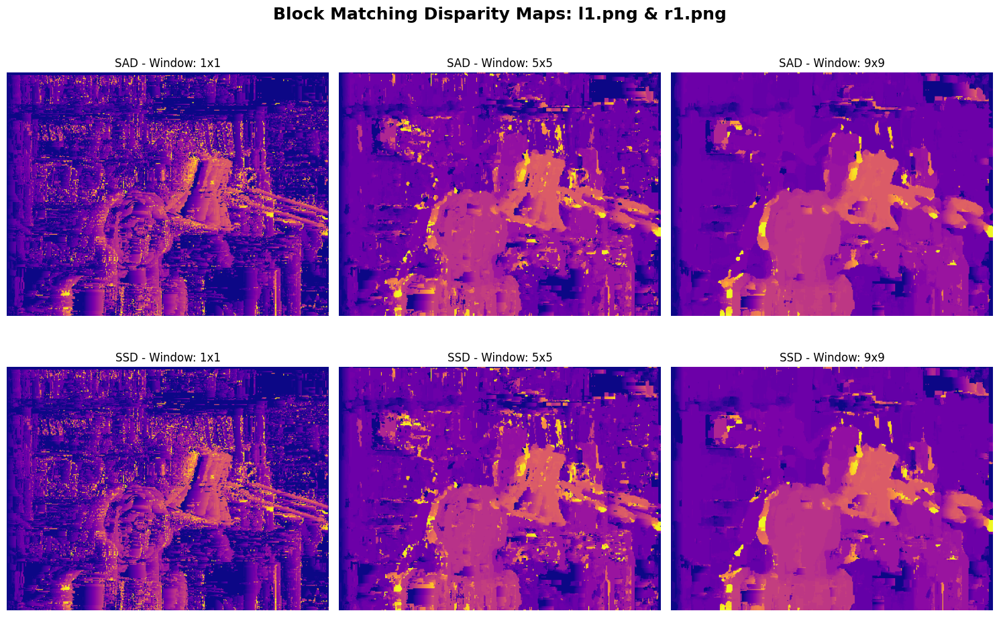

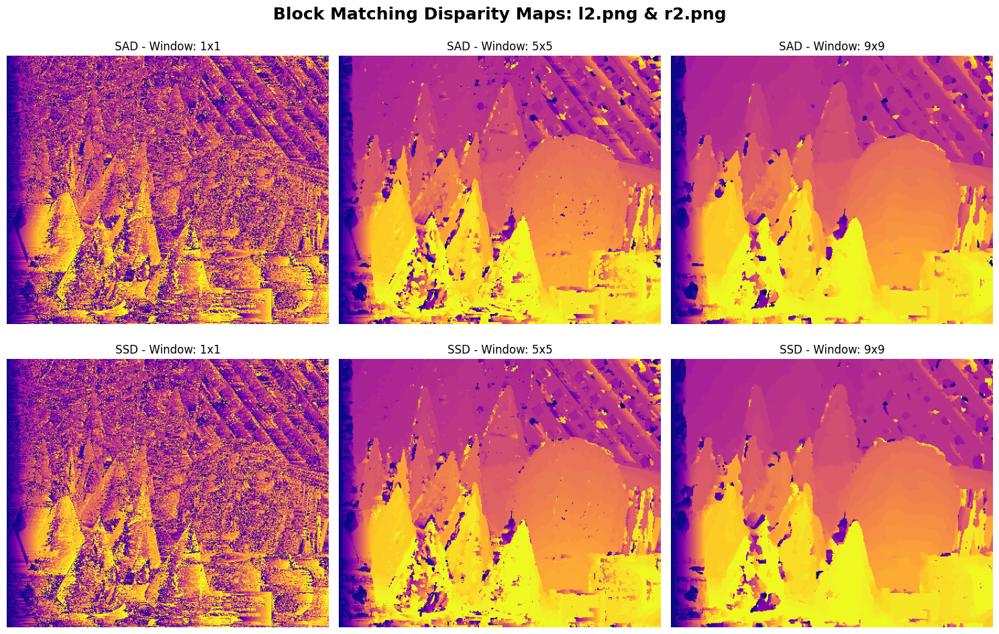

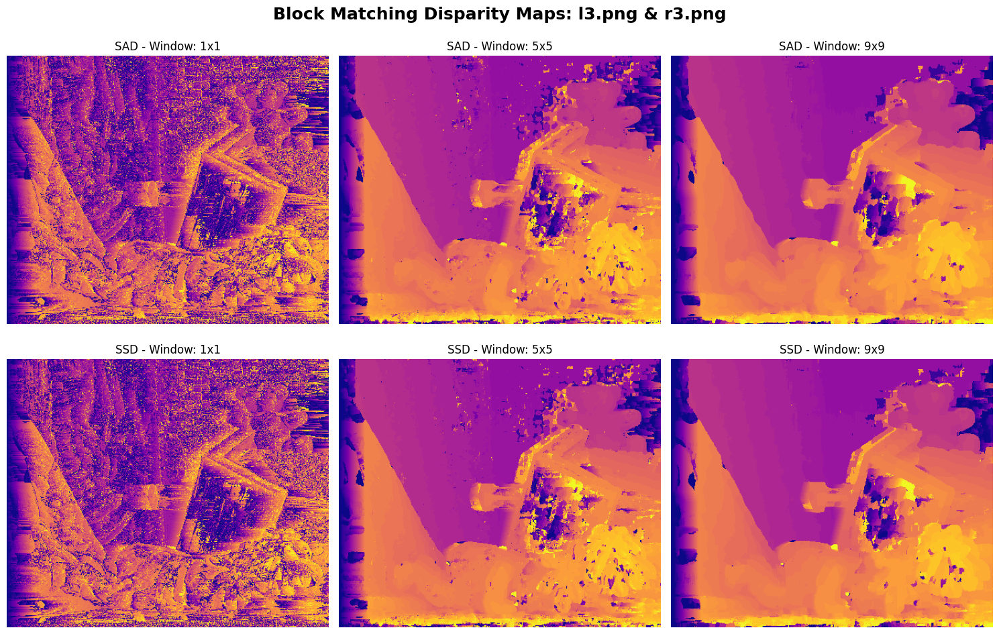

In [7]:
# Loop through the results and generate a separate 2x3 grid for each image pair
for pair_name, pair_results in all_results.items():
    plot_disparity_grid(pair_results, methods, window_sizes, pair_name=pair_name)

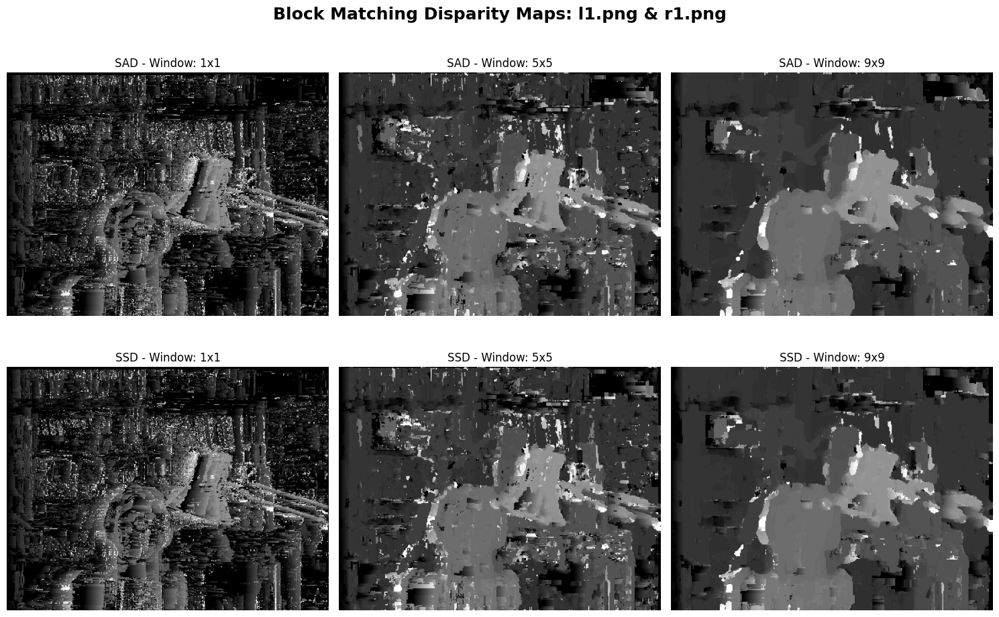

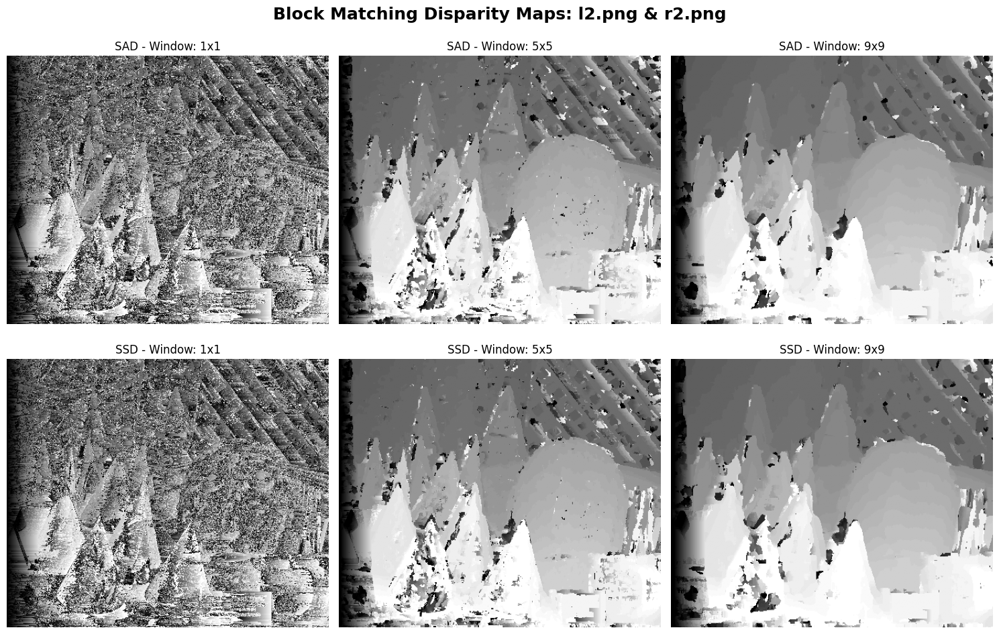

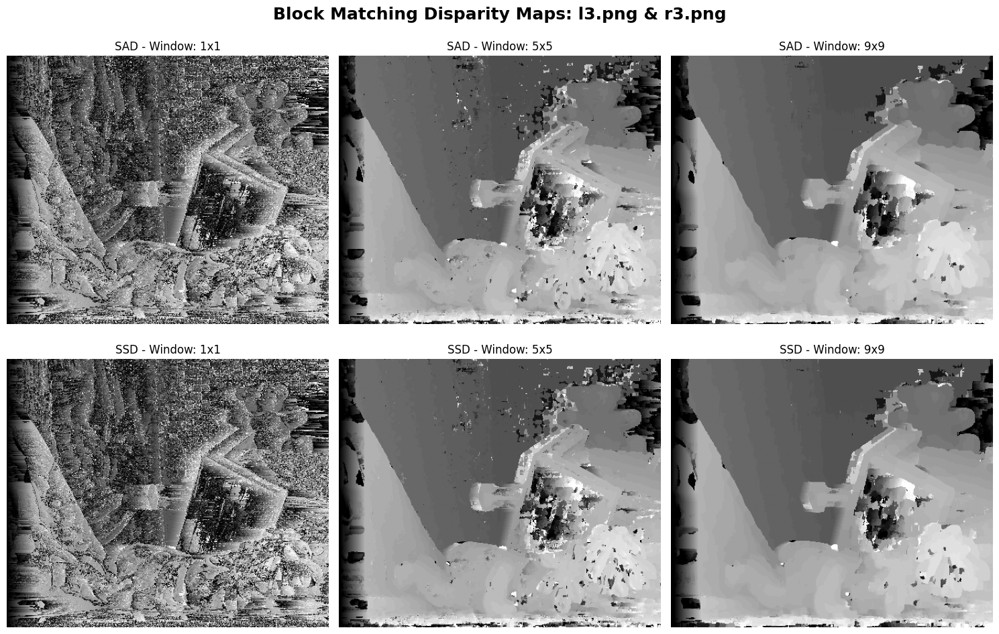

In [9]:
# Loop through the results and generate a separate 2x3 grid for each image pair
for pair_name, pair_results in all_results.items():
    plot_disparity_grid(pair_results, methods, window_sizes, pair_name=pair_name,cmap='gray')

### Conclusion: Part 1.1 Analysis
Based on the generated disparity maps for the three stereo image pairs, we can observe the following key behaviors of the block matching algorithm:

*   **The Effect of Window Size ($w$):** The window size dictates a strict trade-off between noise and edge preservation. 
    *   **$w=1$:** Using a single-pixel window results in highly noisy disparity maps. Without spatial context, the algorithm frequently matches incorrect pixels that happen to have similar intensities.
    *   **$w=5$:** This provides a good middle ground. The spatial context eliminates most of the random noise, revealing the actual depth planes of the scenes.
    *   **$w=9$:** The disparity map becomes very smooth and coherent across flat surfaces. However, it suffers from "foreground fattening" (or edge bleeding), where the boundaries of closer objects are artificially expanded, blurring fine details and object silhouettes.
*   **SAD vs. SSD:** Both the Sum of Absolute Differences (SAD) and Sum of Squared Differences (SSD) successfully capture the depth information. Because SSD squares the intensity differences, it penalizes larger errors more heavily than SAD. Visually, however, both metrics yield very similar disparity maps for a given window size, with SSD occasionally providing slightly smoother regions at the cost of being computationally heavier.
*   **Algorithm Limitations:** While simple and easily vectorized, local block matching inherently struggles with textureless regions (where multiple disparities yield the same minimal cost) and occlusion boundaries (where pixels in one image simply do not exist in the other). 

Overall, finding the optimal parameters requires balancing the need for smooth, continuous surfaces (favoring larger windows) with the need for sharp, accurate object boundaries (favoring smaller windows).